# CNN Project

In [1]:
import io
import os
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.model_selection import KFold, train_test_split

import tensorflow as tf
from tensorflow.keras import Model, Input, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50, VGG16
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, Add, Activation, concatenate
from tensorflow.keras.optimizers import Adam

from google.colab import files

## Set up the Kaggle API

In [2]:
uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 70 bytes


## Download the dataset

In [3]:
!kaggle datasets download "amanara/photos"
!unzip -q photos.zip
!rm photos.zip

Dataset URL: https://www.kaggle.com/datasets/amanara/photos
License(s): unknown
100% 273M/274M [00:02<00:00, 132MB/s]
100% 274M/274M [00:02<00:00, 111MB/s]


## Functions to visualize predictions

In [4]:
# Load and preprocess a single image
def preprocess_single_image(image_path, image_size=(256, 256)):
    img = image.load_img(image_path, target_size=image_size)
    img_array = image.img_to_array(img)  # Convert to numpy array
    img_array=np.interp(img_array, (0, 255), (0, 1))
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

# Post-process the output (if needed)
def postprocess_output(output_array,input_array):
    # Remove batch dimension
    output_image = np.squeeze(output_array, axis=0)
    input_array = np.squeeze(input_array, axis=0)

    mse = np.mean((input_array - output_image) ** 2)
    print(mse)
    # Clip values to valid range (0-255)
    output_image = np.interp(output_image, (0, 1), (0, 255)).astype("uint8")
    return output_image

def visualize_prediction(image_path, model):
    # Example usage
    preprocessed_image = preprocess_single_image(image_path)
    predicted_output = net.predict(preprocessed_image)
    output_image = postprocess_output(predicted_output, preprocessed_image)

    # Display the input and output images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Input Image")
    plt.imshow(image.load_img(image_path))

    plt.subplot(1, 2, 2)
    plt.title("Output Image")
    plt.imshow(output_image)

    plt.show()

def visualize_test_predictions(test_input, test_target, model, n=5):
    samples = random.sample(range(len(test_input)), n)
    for i in samples:
        input_image = test_input[i]
        target_image = test_target[i]

        # Preprocess the input image and get the model's prediction
        preprocessed_image = preprocess_single_image(input_image)
        predicted_output = model.predict(preprocessed_image)
        output_image = postprocess_output(predicted_output, preprocessed_image)

        # Display all three images side by side
        plt.figure(figsize=(15, 5))

        # Input Image
        plt.subplot(1, 3, 1)
        plt.title("Input Image")
        plt.imshow(image.load_img(input_image))
        plt.axis("off")

        # Predicted Output Image
        plt.subplot(1, 3, 2)
        plt.title("Output Image")
        plt.imshow(output_image)
        plt.axis("off")

        # Target Image
        plt.subplot(1, 3, 3)
        plt.title("Target Image")
        plt.imshow(image.load_img(target_image))
        plt.axis("off")

        plt.show()

def plot_training_history(history):
    # Extract metrics from the history object
    metrics = list(history.history.keys())
    train_metrics = [metric for metric in metrics if not metric.startswith("val_")]
    val_metrics = [metric for metric in metrics if metric.startswith("val_")]

    # Create subplots for each metric
    num_metrics = len(train_metrics)
    plt.figure(figsize=(15, 5 * num_metrics))

    for i, train_metric in enumerate(train_metrics):
        val_metric = f"val_{train_metric}"  # Get the corresponding validation metric
        plt.subplot(num_metrics, 1, i + 1)
        plt.plot(history.history[train_metric], label=f"Training {train_metric}")
        if val_metric in metrics:
            plt.plot(history.history[val_metric], label=f"Validation {train_metric}")
        plt.xlabel("Epochs")
        plt.ylabel(train_metric)
        plt.title(train_metric.replace("_", " ").capitalize())
        plt.legend()
        plt.grid(True)

        # Set integer ticks on the x-axis
        epochs = range(1, len(history.history[train_metric]) + 1)
        plt.xticks(ticks=epochs, labels=epochs)

    plt.tight_layout()
    plt.show()

## Dataset classes

In [5]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, input_image_paths, target_image_paths, batch_size=32, image_size=(256, 256), shuffle=True, augment=False, **kwargs):
        super().__init__(**kwargs)
        self.input_image_paths = input_image_paths
        self.target_image_paths = target_image_paths
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.indexes = np.arange(len(self.input_image_paths))
        self.on_epoch_end()

        # Define augmentation (for both input and target images)
        if self.augment:
            self.data_gen_args = {
                "zoom_range": [1.0, 1.15],
                "horizontal_flip": True,
            }
            self.augmenter = ImageDataGenerator(**self.data_gen_args)

    def __len__(self):
        return int(np.floor(len(self.input_image_paths) / self.batch_size))

    def __getitem__(self, index):
        batch_indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_input_image_paths = [self.input_image_paths[i] for i in batch_indexes]
        batch_target_image_paths = [self.target_image_paths[i] for i in batch_indexes]
        X, y = self.__data_generation(batch_input_image_paths, batch_target_image_paths)
        return X, y

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, batch_input_image_paths, batch_target_image_paths):
        X = np.empty((self.batch_size, *self.image_size, 3))
        y = np.empty((self.batch_size, *self.image_size, 3))

        for i, (input_img_path, target_img_path) in enumerate(zip(batch_input_image_paths, batch_target_image_paths)):
            # Load images
            input_img = image.load_img(input_img_path, target_size=self.image_size)
            target_img = image.load_img(target_img_path, target_size=self.image_size)

            input_img_array = image.img_to_array(input_img)
            target_img_array = image.img_to_array(target_img)

            # Normalize images
            input_img_array = np.interp(input_img_array, (0, 255), (0, 1))
            target_img_array = np.interp(target_img_array, (0, 255), (0, 1))

            # Apply augmentation (same transformation for input and target)
            if self.augment:
                seed = np.random.randint(0, 10000)
                input_img_array = self.augmenter.random_transform(input_img_array, seed=seed)
                target_img_array = self.augmenter.random_transform(target_img_array, seed=seed)

            X[i,] = input_img_array
            y[i,] = target_img_array

        return X, y

def get_all_paths_animal(animal_name):

    input_dir, target_dir = [], []
    directory_input = f'/content/Dataset/Training_Data/{animal_name}/Masked_Train'

    all_file_paths = [os.path.join(directory_input, file) for file in os.listdir(directory_input) if os.path.isfile(os.path.join(directory_input, file))]
    for file_path in all_file_paths:
        input_dir.append(file_path)

    directory_target = f'/content/Dataset/Training_Data/{animal_name}/Unmasked_Train'

    all_file_paths = [os.path.join(directory_target, file) for file in os.listdir(directory_target) if os.path.isfile(os.path.join(directory_target, file))]
    for file_path in all_file_paths:
        target_dir.append(file_path)

    return input_dir, target_dir

def get_all_paths():
    animal_names = ['Cat', 'Dog', 'Elephant', 'Tiger']
    input_dir_all, target_dir_all = [], []
    for animal_name in animal_names:
        input_dir, target_dir = get_all_paths_animal(animal_name)
        input_dir_all.extend(input_dir)
        target_dir_all.extend(target_dir)
    return input_dir_all, target_dir_all

## Split the dataset into training, validation and testing

In [14]:
# input_image_paths, target_image_paths = get_all_paths_animal("Dog")
input_image_paths, target_image_paths = get_all_paths()

# Split data into training, validation, and testing sets
train_input, test_input, train_target, test_target = train_test_split(
    input_image_paths, target_image_paths, test_size=0.2, random_state=42
)
train_input, val_input, train_target, val_target = train_test_split(
    train_input, train_target, test_size=0.25, random_state=42
)  # 0.25 * 0.8 = 0.2 validation split

# Create data generators for each dataset
batch_size = 32
train_generator = DataGenerator(train_input, train_target, batch_size=batch_size, image_size=(256, 256), augment=True)
val_generator = DataGenerator(val_input, val_target, batch_size=batch_size, image_size=(256, 256))
test_generator = DataGenerator(test_input, test_target, batch_size=batch_size, image_size=(256, 256))

## UNET

In [7]:
def get_conv_block(in_layer, filters):
    conv1 = Conv2D(filters, (3, 3), padding='same', activation="relu")(in_layer)
    conv2 = Conv2D(filters, (3, 3), padding='same', activation="relu")(conv1)
    return conv2

def get_downsample(in_layer, filters):
    conv_block = get_conv_block(in_layer, filters)
    pool = MaxPooling2D(pool_size=(2, 2))(conv_block)
    return pool, conv_block

def get_upsample(in_layer, filters, skip):
    upsample = Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(in_layer)
    upconv = concatenate([upsample, skip], axis=3)
    conv_block = get_conv_block(upconv, filters)
    return conv_block

def get_unet(depth=4, optimizer='adam', loss='mse', metrics=['mse', 'mae']):
    layers = [Input(shape=(None, None, 3))]
    skips = []

    # Encoder
    for i in range(depth):
        down, skip = get_downsample(layers[-1], 2**(i+5))
        layers.append(down)
        skips.append(skip)

    # Bottleneck
    layers.append(get_conv_block(layers[-1], 2**(depth+5)))

    # Decoder
    for i in reversed(range(depth)):
        up = get_upsample(layers[-1], 2**(i+5), skips[i])
        layers.append(up)

    # Output Layer
    layers.append(Conv2D(3, (1, 1), padding='same', activation="sigmoid")(layers[-1]))

    model = Model(inputs=layers[0], outputs=layers[-1])
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

    return model

In [8]:
unet = get_unet()
unet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, None, None, 32) │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, None, None, 32) │          9,248 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, None, None, 32) │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, None, None, 64) │         18,496 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, None, None, 64) │         36,928 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, None, None, 64) │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, None, None,     │         73,856 │ max_pooling2d_1[0][0]  │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, None, None,     │        147,584 │ conv2d_4[0][0]         │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, None, None,     │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, None, None,     │        295,168 │ max_pooling2d_2[0][0]  │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, None, None,     │        590,080 │ conv2d_6[0][0]         │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, None, None,     │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, None, None,     │      1,180,160 │ max_pooling2d_3[0][0]  │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, None, None,     │      2,359,808 │ conv2d_8[0][0]         │
│                      

 Total params: 7,760,163 (29.60 MB)

 Trainable params: 7,760,163 (29.60 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 275s 2s/step - loss: 0.0405 - mae: 0.1494 - mse: 0.0405 - val_loss: 0.0085 - val_mae: 0.0552 - val_mse: 0.0085
Epoch 2/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 240s 1s/step - loss: 0.0066 - mae: 0.0467 - mse: 0.0066 - val_loss: 0.0062 - val_mae: 0.0427 - val_mse: 0.0062
Epoch 3/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 208s 1s/step - loss: 0.0053 - mae: 0.0385 - mse: 0.0053 - val_loss: 0.0056 - val_mae: 0.0380 - val_mse: 0.0056
Epoch 4/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 191s 1s/step - loss: 0.0048 - mae: 0.0335 - mse: 0.0048 - val_loss: 0.0053 - val_mae: 0.0349 - val_mse: 0.0053
Epoch 5/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - loss: 0.0044 - mae: 0.0313 - mse: 0.0044 - val_loss: 0.0057 - val_mae: 0.0415 - val_mse: 0.0057
Epoch 6/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 203s 1s/step - loss: 0.0044 - mae: 0.0310 - mse: 0.0044 - val_loss: 0.0063 - val_mae: 0.0350 - val_mse: 0.0063
Epoch 7/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 184s 1s/step - loss: 0.0042 - mae: 0.0288 - mse: 0.004

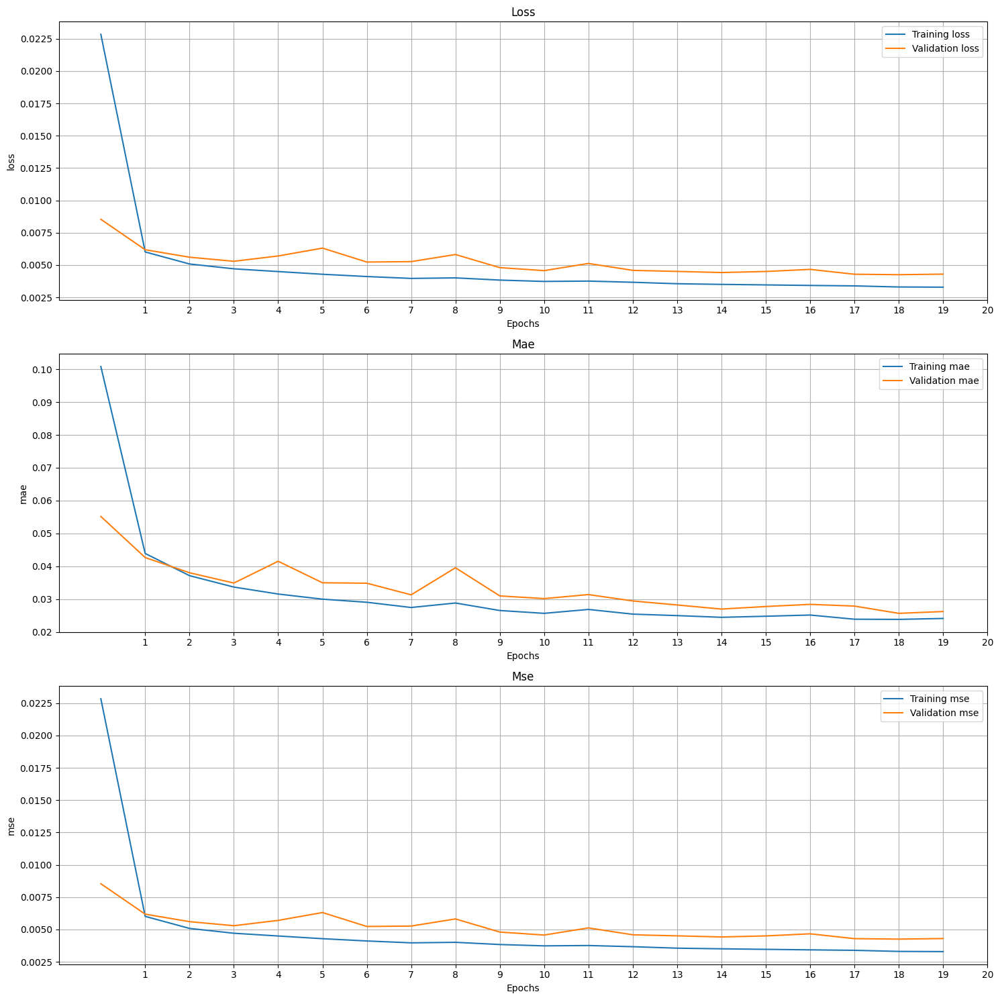

43/43 ━━━━━━━━━━━━━━━━━━━━ 14s 319ms/step - loss: 0.0043 - mae: 0.0261 - mse: 0.0043
Test Loss: 0.0042, Test MSE: 0.0042, Test MAE: 0.0259
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
0.010419154238311802


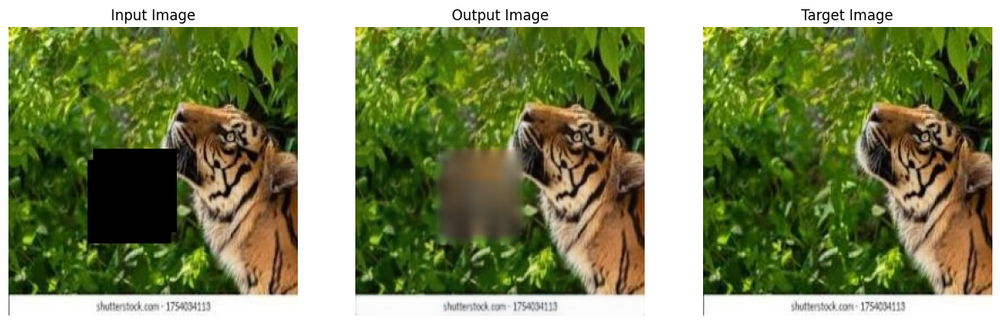

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
0.055542150213961035


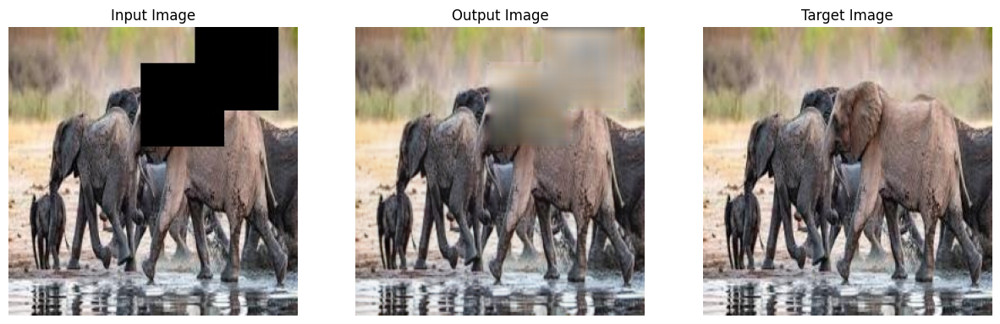

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
0.054878538879116756


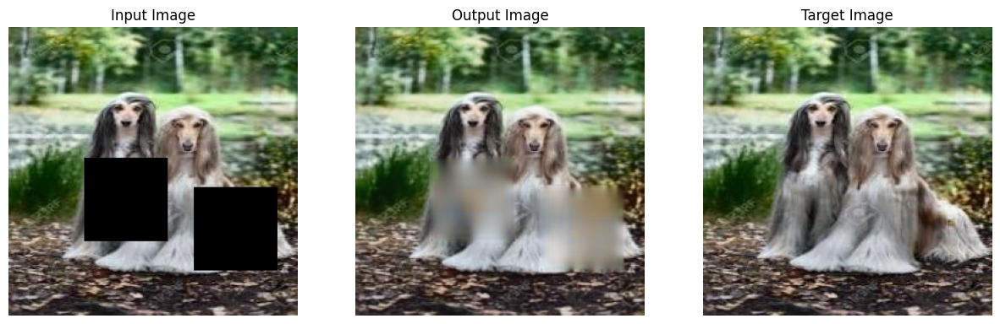

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
0.05850180019560545


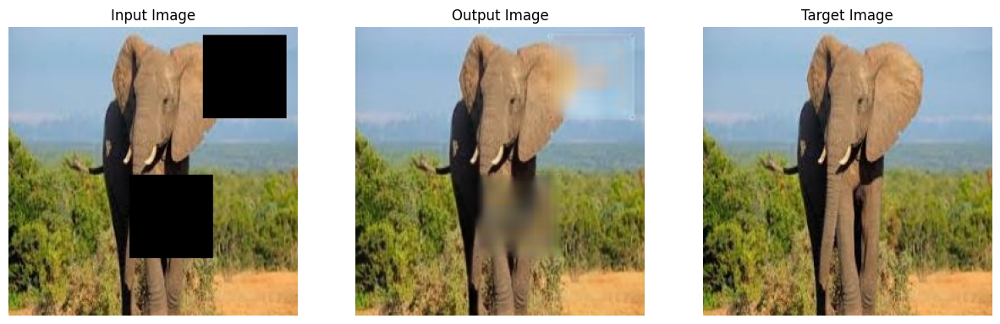

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
0.047957163964696896


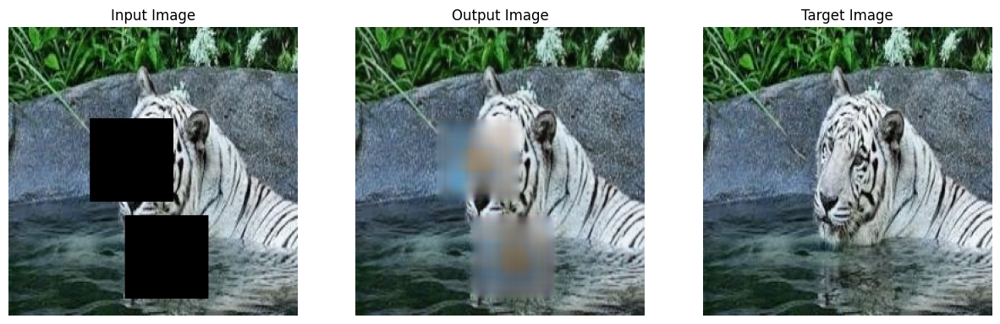

In [9]:
history = unet.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator
)

plot_training_history(history)

test_loss, test_mse, test_mae = unet.evaluate(test_generator)
print(f"Test Loss: {test_loss:.4f}, Test MSE: {test_mse:.4f}, Test MAE: {test_mae:.4f}")

visualize_test_predictions(test_input, test_target, unet)

In [10]:
unet.save("Unet_model.h5")

## Residual UNET

In [ ]:
def get_residual_block(in_layer, filters):
    """
    Residual block: Two convolutions with a shortcut connection.
    """
    conv1 = Conv2D(filters, (3, 3), padding='same', activation="relu")(in_layer)
    conv2 = Conv2D(filters, (3, 3), padding='same', activation=None)(conv1)
    shortcut = Conv2D(filters, (1, 1), padding='same', activation=None)(in_layer)  # Shortcut connection
    output = Add()([conv2, shortcut])  # Add shortcut to convolution output
    return Activation("relu")(output)

def get_residual_downsample(in_layer, filters):
    """
    Downsampling with residual blocks and max pooling.
    """
    res_block = get_residual_block(in_layer, filters)
    pool = MaxPooling2D(pool_size=(2, 2))(res_block)  # Downsampling
    return pool, res_block

def get_residual_upsample(in_layer, filters, skip):
    """
    Upsampling with residual blocks and concatenation of skip connections.
    """
    upsample = Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(in_layer)  # Upsampling
    upconv = concatenate([upsample, skip], axis=3)  # Concatenate skip connection
    res_block = get_residual_block(upconv, filters)
    return res_block

def get_residual_unet(depth=4, optimizer='adam', loss='mse', metrics=['mse', 'mae']):
    """
    Builds the Residual UNet model.
    """
    layers = [Input(shape=(None, None, 3))]  # Input layer
    skips = []  # Skip connections for the encoder

    # Encoder
    for i in range(depth):
        down, skip = get_residual_downsample(layers[-1], 2**(i+5))  # Increase filters exponentially
        layers.append(down)
        skips.append(skip)

    # Bottleneck
    layers.append(get_residual_block(layers[-1], 2**(depth+5)))  # Deepest layer

    # Decoder
    for i in reversed(range(depth)):
        up = get_residual_upsample(layers[-1], 2**(i+5), skips[i])  # Use skip connections from encoder
        layers.append(up)

    # Output Layer
    layers.append(Conv2D(3, (1, 1), padding='same', activation="sigmoid")(layers[-1]))  # 3-channel output (RGB)

    # Compile model
    model = Model(inputs=layers[0], outputs=layers[-1])
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

    return model

In [ ]:
residual_unet = get_residual_unet()
residual_unet.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, None, None, 3)  │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_104 (Conv2D)       │ (None, None, None, 32) │            896 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_105 (Conv2D)       │ (None, None, None, 32) │          9,248 │ conv2d_104[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_106 (Conv2D)       │ (None, None, None, 32) │            128 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_9 (Add)               │ (None, None, None, 32) │              0 │ conv2d_105[0][0],      │
│                           │                        │                │ conv2d_106[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_9 (Activation) │ (None, None, None, 32) │              0 │ add_9[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_20          │ (None, None, None, 32) │              0 │ activation_9[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_107 (Conv2D)       │ (None, None, None, 64) │         18,496 │ max_pooling2d_20[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_108 (Conv2D)       │ (None, None, None, 64) │         36,928 │ conv2d_107[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_109 (Conv2D)       │ (None, None, None, 64) │          2,112 │ max_pooling2d_20[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_10 (Add)              │ (None, None, None, 64) │              0 │ conv2d_108[0][0],      │
│                           │                        │                │ conv2d_109[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_10             │ (None, None, None, 64) │              0 │ add_10[0][0]           │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_21          │ (None, None, None, 64) │              0 │ activation_10[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_110 (Conv2D)       │ (None, None, None,     │         73,856 │ max_pooling2d_21[0][0] │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_111 (Conv2D)       │ (None, None, None,     │        147,584 │ conv2d_110[0][0]       │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_112 (Conv2D)  

 Total params: 8,109,891 (30.94 MB)

 Trainable params: 8,109,891 (30.94 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 114s 752ms/step - loss: 0.0381 - mae: 0.1405 - mse: 0.0381 - val_loss: 0.0070 - val_mae: 0.0523 - val_mse: 0.0070
Epoch 2/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 136s 735ms/step - loss: 0.0062 - mae: 0.0440 - mse: 0.0062 - val_loss: 0.0053 - val_mae: 0.0378 - val_mse: 0.0053
Epoch 3/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 142s 736ms/step - loss: 0.0054 - mae: 0.0376 - mse: 0.0054 - val_loss: 0.0052 - val_mae: 0.0346 - val_mse: 0.0052
Epoch 4/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 142s 736ms/step - loss: 0.0053 - mae: 0.0359 - mse: 0.0053 - val_loss: 0.0046 - val_mae: 0.0305 - val_mse: 0.0046
Epoch 5/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 141s 737ms/step - loss: 0.0047 - mae: 0.0317 - mse: 0.0047 - val_loss: 0.0052 - val_mae: 0.0428 - val_mse: 0.0052
Epoch 6/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 148s 789ms/step - loss: 0.0046 - mae: 0.0321 - mse: 0.0046 - val_loss: 0.0044 - val_mae: 0.0287 - val_mse: 0.0044
Epoch 7/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 98s 736ms/step - loss: 0.0043 - mae:

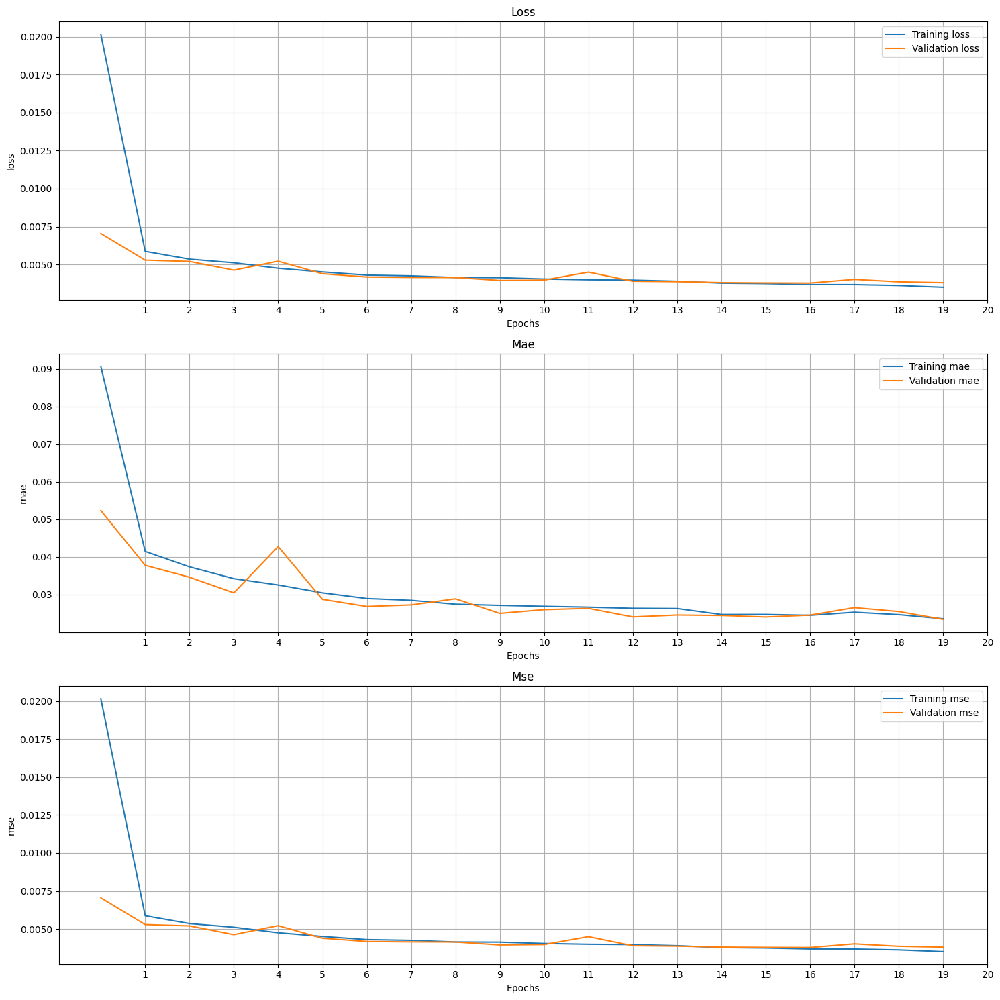

43/43 ━━━━━━━━━━━━━━━━━━━━ 14s 321ms/step - loss: 0.0039 - mae: 0.0238 - mse: 0.0039
Test Loss: 0.0039, Test MSE: 0.0039, Test MAE: 0.0237
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
0.049728009661772044


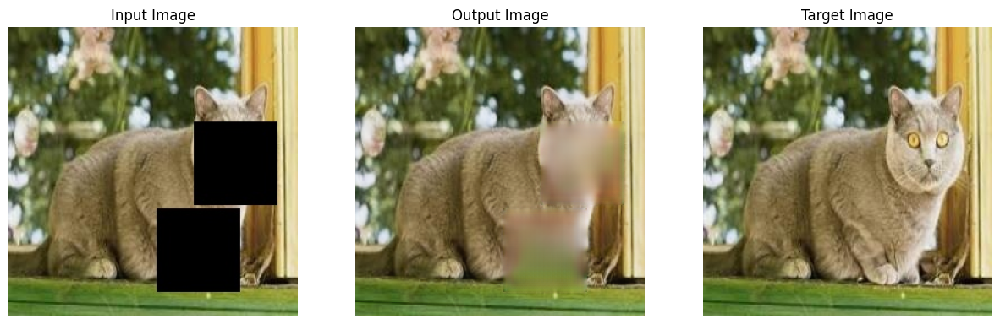

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
0.018513289160680495


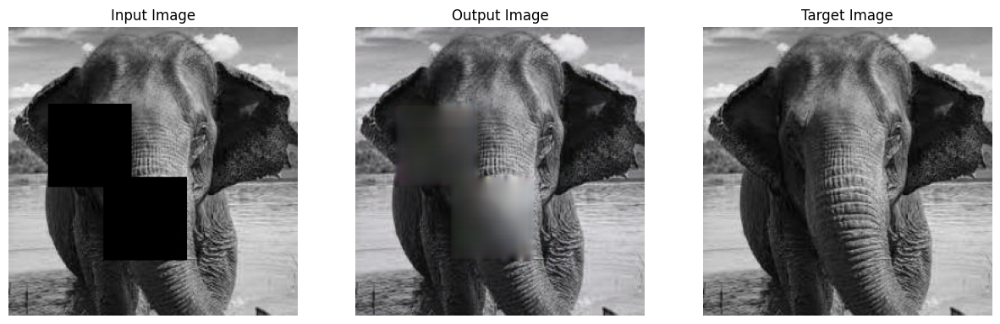

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
0.06474092282332174


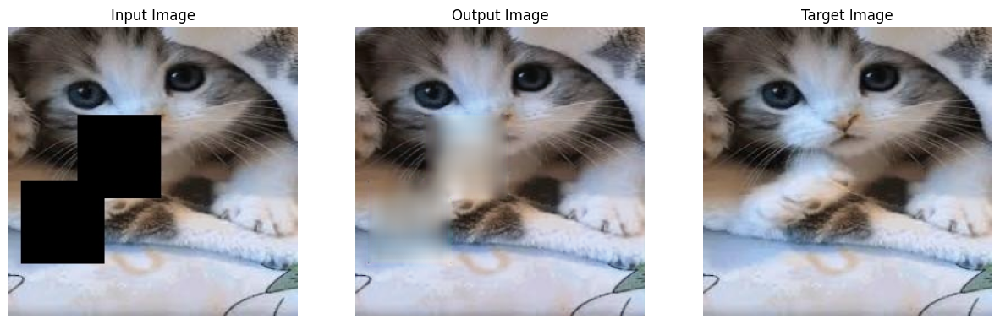

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
0.08885719971254098


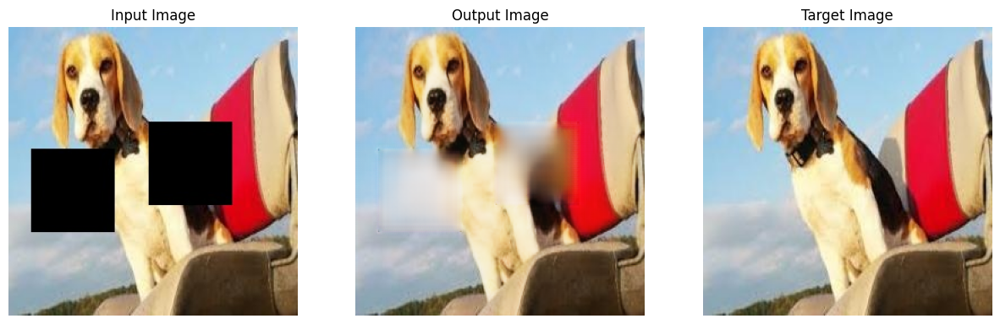

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
0.03340313198672489


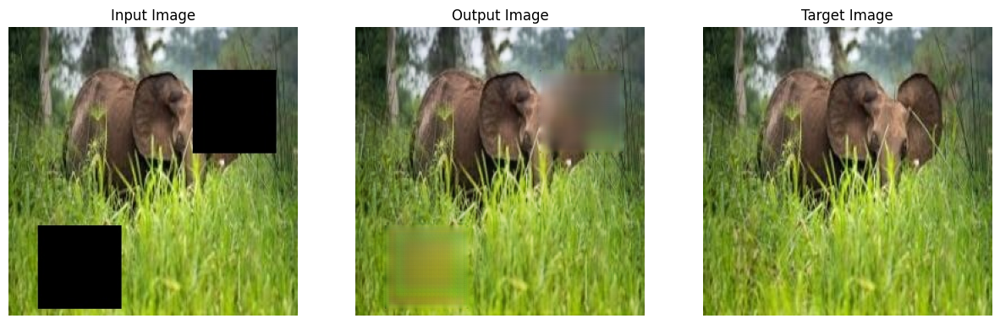

In [ ]:
history = residual_unet.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator
)

plot_training_history(history)

test_loss, test_mse, test_mae = residual_unet.evaluate(test_generator)
print(f"Test Loss: {test_loss:.4f}, Test MSE: {test_mse:.4f}, Test MAE: {test_mae:.4f}")

visualize_test_predictions(test_input, test_target, residual_unet)

In [ ]:
residual_unet.save("Residual_Unet_model.keras")

## Dilated UNET

In [ ]:
def get_dilated_conv_block(in_layer, filters, dilation_rate=2):
    """
    Dilated convolution block with two layers using specified dilation rate.
    """
    conv1 = Conv2D(filters, (3, 3), padding='same', dilation_rate=dilation_rate, activation="relu")(in_layer)
    conv2 = Conv2D(filters, (3, 3), padding='same', dilation_rate=dilation_rate, activation="relu")(conv1)
    return conv2

def get_downsample(in_layer, filters):
    """
    Downsampling block with standard convolution and max pooling.
    """
    conv_block = Conv2D(filters, (3, 3), padding='same', activation="relu")(in_layer)
    pool = MaxPooling2D(pool_size=(2, 2))(conv_block)
    return pool, conv_block

def get_upsample(in_layer, filters, skip):
    """
    Upsampling block with transposed convolution and concatenation of skip connection.
    """
    upsample = Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(in_layer)
    upconv = concatenate([upsample, skip], axis=3)
    conv_block = Conv2D(filters, (3, 3), padding='same', activation="relu")(upconv)
    return conv_block

def get_dilated_unet(depth=4, optimizer='adam', loss='mse', metrics=['mse', 'mae'], dilation_rate=2):
    """
    Builds a Dilated UNet model with atrous convolutions in the bottleneck.
    """
    layers = [Input(shape=(None, None, 3))]  # Input layer
    skips = []  # Skip connections for the encoder

    # Encoder
    for i in range(depth):
        down, skip = get_downsample(layers[-1], 2**(i+5))  # Increase filters exponentially
        layers.append(down)
        skips.append(skip)

    # Bottleneck with dilated convolutions
    layers.append(get_dilated_conv_block(layers[-1], 2**(depth+5), dilation_rate=dilation_rate))

    # Decoder
    for i in reversed(range(depth)):
        up = get_upsample(layers[-1], 2**(i+5), skips[i])  # Use skip connections from encoder
        layers.append(up)

    # Output Layer
    layers.append(Conv2D(3, (1, 1), padding='same', activation="sigmoid")(layers[-1]))  # 3-channel output (RGB)

    # Compile model
    model = Model(inputs=layers[0], outputs=layers[-1])
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

    return model

In [ ]:
dilated_unet = get_dilated_unet()
dilated_unet.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, None, None, 3)  │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_132 (Conv2D)       │ (None, None, None, 32) │            896 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_24          │ (None, None, None, 32) │              0 │ conv2d_132[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_133 (Conv2D)       │ (None, None, None, 64) │         18,496 │ max_pooling2d_24[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_25          │ (None, None, None, 64) │              0 │ conv2d_133[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_134 (Conv2D)       │ (None, None, None,     │         73,856 │ max_pooling2d_25[0][0] │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_26          │ (None, None, None,     │              0 │ conv2d_134[0][0]       │
│ (MaxPooling2D)            │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_135 (Conv2D)       │ (None, None, None,     │        295,168 │ max_pooling2d_26[0][0] │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_27          │ (None, None, None,     │              0 │ conv2d_135[0][0]       │
│ (MaxPooling2D)            │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_136 (Conv2D)       │ (None, None, None,     │      1,180,160 │ max_pooling2d_27[0][0] │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_137 (Conv2D)       │ (None, None, None,     │      2,359,808 │ conv2d_136[0][0]       │
│                           │ 512)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_24       │ (None, None, None,     │        524,544 │ conv2d_137[0][0]       │
│ (Conv2DTranspose)         │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_24            │ (None, None, None,     │              0 │ conv2d_transpose_24[0… │
│ (Concatenate)             │ 512)                   │                │ conv2d_135[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_138 (Conv2D)       │ (None, None, None,     │      1,179,904 │ concatenate_24[0][0]   │
│                      

 Total params: 6,192,483 (23.62 MB)

 Trainable params: 6,192,483 (23.62 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 83s 520ms/step - loss: 0.0431 - mae: 0.1558 - mse: 0.0431 - val_loss: 0.0066 - val_mae: 0.0466 - val_mse: 0.0066
Epoch 2/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 68s 501ms/step - loss: 0.0065 - mae: 0.0473 - mse: 0.0065 - val_loss: 0.0055 - val_mae: 0.0399 - val_mse: 0.0055
Epoch 3/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 81s 605ms/step - loss: 0.0056 - mae: 0.0400 - mse: 0.0056 - val_loss: 0.0051 - val_mae: 0.0358 - val_mse: 0.0051
Epoch 4/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 70s 516ms/step - loss: 0.0052 - mae: 0.0365 - mse: 0.0052 - val_loss: 0.0047 - val_mae: 0.0323 - val_mse: 0.0047
Epoch 5/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 86s 536ms/step - loss: 0.0047 - mae: 0.0326 - mse: 0.0047 - val_loss: 0.0045 - val_mae: 0.0304 - val_mse: 0.0045
Epoch 6/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 68s 504ms/step - loss: 0.0044 - mae: 0.0308 - mse: 0.0044 - val_loss: 0.0044 - val_mae: 0.0294 - val_mse: 0.0044
Epoch 7/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 68s 504ms/step - loss: 0.0043 - mae: 0.030

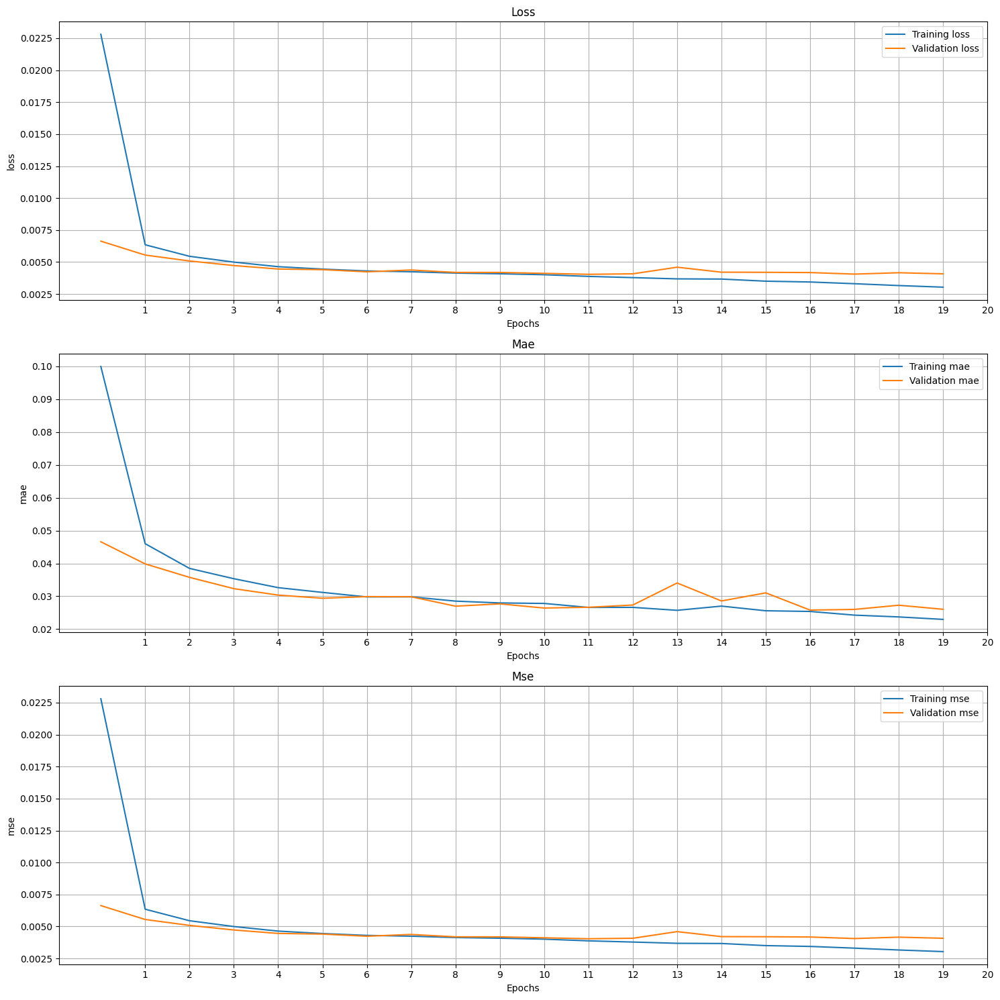

43/43 ━━━━━━━━━━━━━━━━━━━━ 14s 311ms/step - loss: 0.0042 - mae: 0.0262 - mse: 0.0042
Test Loss: 0.0041, Test MSE: 0.0041, Test MAE: 0.0262
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
0.040268543541908654


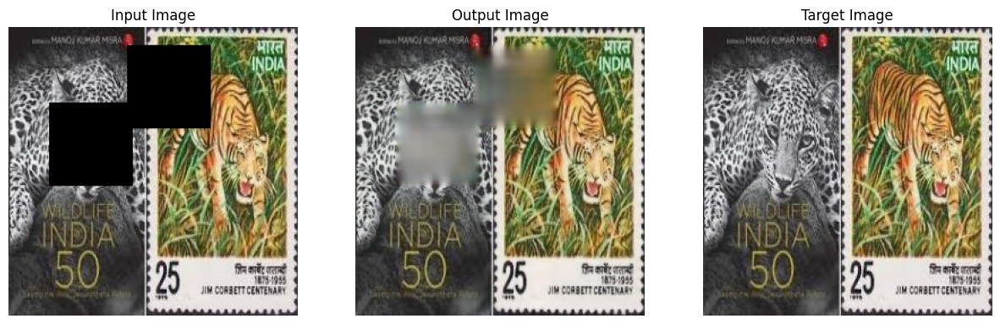

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
0.021738628450623285


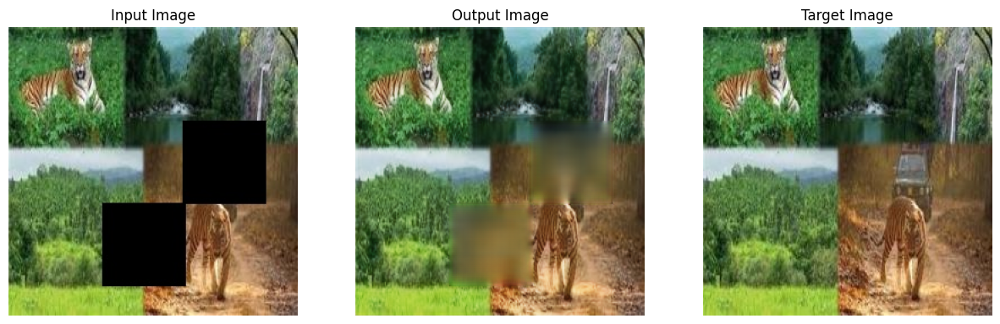

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
0.01197797470066777


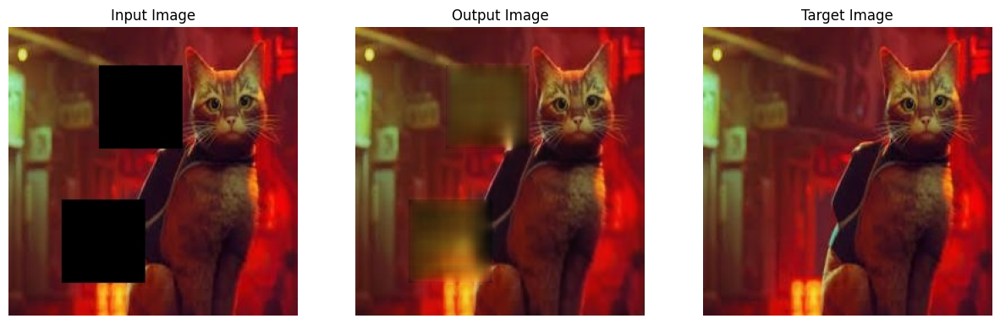

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
0.049570141997993034


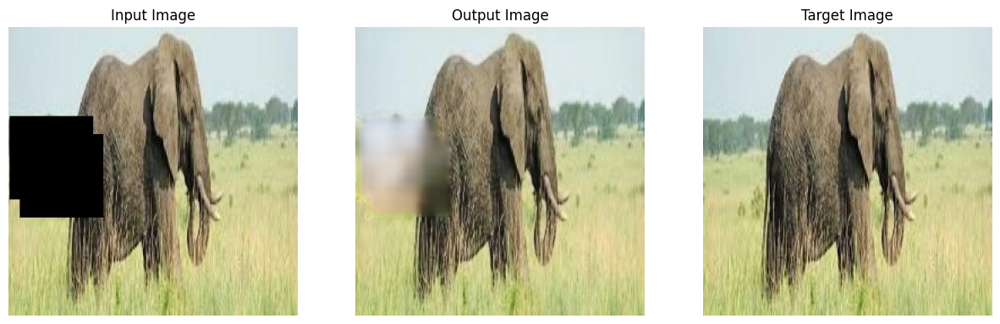

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
0.05396801118298481


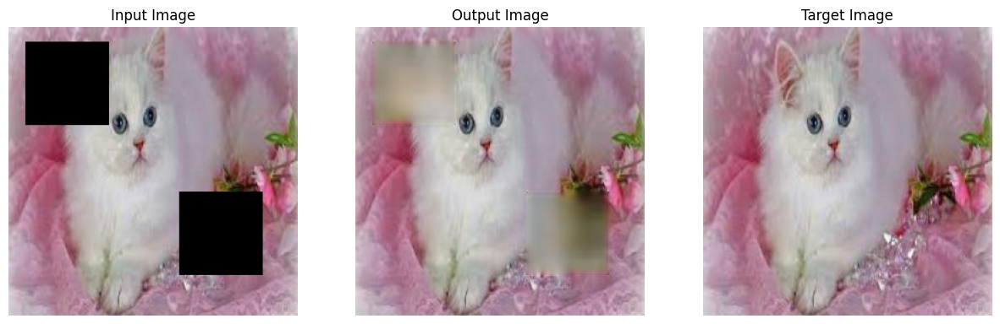

In [ ]:
history = dilated_unet.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator
)

plot_training_history(history)

test_loss, test_mse, test_mae = dilated_unet.evaluate(test_generator)
print(f"Test Loss: {test_loss:.4f}, Test MSE: {test_mse:.4f}, Test MAE: {test_mae:.4f}")

visualize_test_predictions(test_input, test_target, dilated_unet)

In [ ]:
dilated_unet.save("Dilated_Unet_model.keras")

## Cross-validation

In [11]:
input_image_paths, target_image_paths = get_all_paths_animal("Dog")

zipped = list(zip(input_image_paths, target_image_paths))
np.random.shuffle(zipped)

input_image_paths, target_image_paths = zip(*zipped)
input_image_paths = np.array(input_image_paths)
target_image_paths = np.array(target_image_paths)

train_input_image_paths,train_target_image_paths=input_image_paths[:1500],target_image_paths[:1500]
test_input_image_paths,test_target_image_paths=input_image_paths[1500:],target_image_paths[1500:]

# Set up 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

batch_size = 8
for fold, (train_indices, val_indices) in enumerate(kf.split(train_input_image_paths)):
    print(f"Fold {fold + 1}")

    # Split into training and validation sets for this fold
    X_train = [input_image_paths[i] for i in train_indices]
    y_train = [target_image_paths[i] for i in train_indices]
    X_val = [input_image_paths[i] for i in val_indices]
    y_val = [target_image_paths[i] for i in val_indices]

    model = get_unet()

    train_generator = DataGenerator(X_train, y_train, batch_size=32, image_size=(256, 256), augment=True)
    val_generator =  DataGenerator(X_val, y_val, batch_size=32, image_size=(256, 256))

    model.fit(
        train_generator,
        epochs=5,
        validation_data=val_generator
    )

    # Optionally save the model or evaluate it after training
    # model.save(f"model_fold_{fold + 1}.h5")

Fold 1
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - loss: 0.0662 - mae: 0.2152 - mse: 0.0662 - val_loss: 0.0288 - val_mae: 0.1233 - val_mse: 0.0288
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - loss: 0.0228 - mae: 0.1053 - mse: 0.0228 - val_loss: 0.0164 - val_mae: 0.0878 - val_mse: 0.0164
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - loss: 0.0194 - mae: 0.0948 - mse: 0.0194 - val_loss: 0.0140 - val_mae: 0.0810 - val_mse: 0.0140
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - loss: 0.0126 - mae: 0.0740 - mse: 0.0126 - val_loss: 0.0105 - val_mae: 0.0609 - val_mse: 0.0105
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - loss: 0.0075 - mae: 0.0514 - mse: 0.0075 - val_loss: 0.0082 - val_mae: 0.0534 - val_mse: 0.0082
Fold 2
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - loss: 0.0699 - mae: 0.2198 - mse: 0.0699 - val_loss: 0.0252 - val_mae: 0.1126 - val_mse: 0.0252
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - loss: 0.0204 - mae: 0.0955 - mse: 0.0204 - val_loss: 

## Testing different loss functions

### Define preceptual loss

In [12]:
# Load the pre-trained VGG16 model
vgg = VGG16(include_top=False, weights='imagenet')
vgg.trainable = False  # Freeze VGG16 weights

# Extract specific layers for perceptual loss
perceptual_model = Model(inputs=vgg.input,
                         outputs=[vgg.get_layer('block3_conv3').output,
                                  vgg.get_layer('block4_conv3').output])

def perceptual_loss(y_true, y_pred) -> float:
    # Normalize images to the range [0, 1] expected by VGG16
    y_true_vgg = tf.keras.applications.vgg16.preprocess_input(y_true * 255.0)
    y_pred_vgg = tf.keras.applications.vgg16.preprocess_input(y_pred * 255.0)

    # Extract features from the pre-trained network
    true_features = perceptual_model(y_true_vgg)
    pred_features = perceptual_model(y_pred_vgg)

    # Compute the MSE between feature maps
    perceptual_loss_value = 0
    for true_f, pred_f in zip(true_features, pred_features):
        perceptual_loss_value += tf.reduce_mean(tf.square(true_f - pred_f))

    # Optionally combine with pixel-wise loss (e.g., MSE)
    pixel_loss = tf.reduce_mean(tf.square(y_true - y_pred))

    return perceptual_loss_value + pixel_loss

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


### Test MSE, MAE and perceptual loss

Training with mse loss...
Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 180s 1s/step - loss: 0.0392 - mae: 0.1465 - mse: 0.0392
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 170s 1s/step - loss: 0.0068 - mae: 0.0509 - mse: 0.0068
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 201s 1s/step - loss: 0.0051 - mae: 0.0388 - mse: 0.0051
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 170s 1s/step - loss: 0.0047 - mae: 0.0350 - mse: 0.0047
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 201s 1s/step - loss: 0.0045 - mae: 0.0339 - mse: 0.0045
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 204s 1s/step - loss: 0.0045 - mae: 0.0342 - mse: 0.0045
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 170s 1s/step - loss: 0.0097 - mae: 0.0544 - mse: 0.0097
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 170s 1s/step - loss: 0.0142 - mae: 0.0666 - mse: 0.0142
Epoch 9/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - loss: 0.0067 - mae: 0.0457 - mse: 0.0067
Epoch 10/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - loss: 0.0049 - mae: 0.0358 - mse: 0.0049
1/1 ━━━━━━━━━

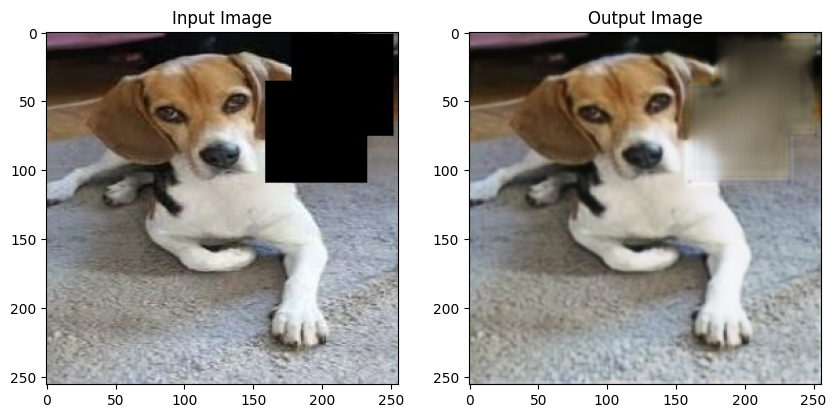

Training with mae loss...
Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - loss: 0.1609 - mae: 0.1609 - mse: 0.0457
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 199s 1s/step - loss: 0.0573 - mae: 0.0573 - mse: 0.0099
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 200s 1s/step - loss: 0.0380 - mae: 0.0380 - mse: 0.0057
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 170s 1s/step - loss: 0.0348 - mae: 0.0348 - mse: 0.0050
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - loss: 0.0311 - mae: 0.0311 - mse: 0.0047
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 168s 1s/step - loss: 0.0309 - mae: 0.0309 - mse: 0.0045
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 168s 1s/step - loss: 0.0306 - mae: 0.0306 - mse: 0.0044
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 168s 1s/step - loss: 0.0271 - mae: 0.0271 - mse: 0.0042
Epoch 9/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - loss: 0.0259 - mae: 0.0259 - mse: 0.0041
Epoch 10/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 168s 1s/step - loss: 0.0260 - mae: 0.0260 - mse: 0.0040
1/1 ━━━━━━━━━

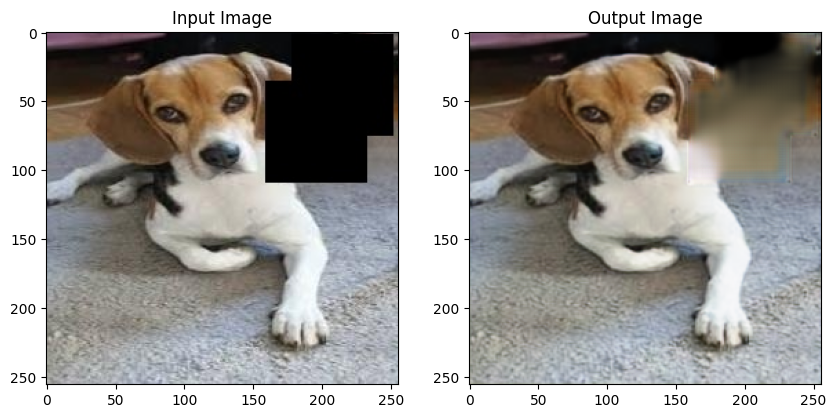

Training with perceptual loss...
Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 269s 2s/step - loss: 90905.3281 - mae: 0.1969 - mse: 0.0591
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 265s 2s/step - loss: 34630.4102 - mae: 0.0598 - mse: 0.0084
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - loss: 30495.2070 - mae: 0.0494 - mse: 0.0062
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - loss: 28197.3008 - mae: 0.0450 - mse: 0.0054
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - loss: 27286.1738 - mae: 0.0429 - mse: 0.0051
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - loss: 26623.4727 - mae: 0.0409 - mse: 0.0049
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - loss: 26047.5020 - mae: 0.0400 - mse: 0.0047
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 261s 2s/step - loss: 25687.0488 - mae: 0.0390 - mse: 0.0045
Epoch 9/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 262s 2s/step - loss: 25412.9727 - mae: 0.0382 - mse: 0.0044
Epoch 10/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 204s 2s/step - loss: 24594

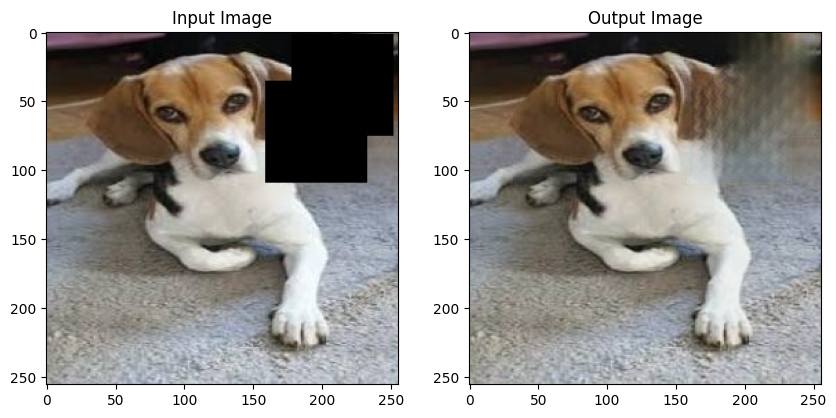

In [15]:
loss_functions = {
    "mse": tf.keras.losses.MeanSquaredError(),
    "mae": tf.keras.losses.MeanAbsoluteError(),
    "perceptual": perceptual_loss
}

for loss_function_name, loss_function in loss_functions.items():
    print(f"Training with {loss_function_name} loss...")
    net = get_unet(loss=loss_function)
    net.fit(train_generator, epochs=10)
    visualize_prediction("/content/Dataset/Testing_Data/Dog-Train (820).jpeg", net)

## Testing different optimizers

In [16]:
optimizers = {
    "adam": tf.keras.optimizers.Adam(),
    "sgd": tf.keras.optimizers.SGD(),
    "rmsprop": tf.keras.optimizers.RMSprop()
}

for optimizer_name, optimizer in optimizers.items():
    print(f"Training with {optimizer_name} optimizer...")
    net = get_unet(optimizer=optimizer)
    net.fit(train_generator, epochs=10)
    visualize_prediction("/content/Dataset/Testing_Data/Dog-Train (820).jpeg", net)

Training with adam optimizer...
Epoch 1/10
123/131 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - loss: 0.0440 - mae: 0.1572 - mse: 0.0440

KeyboardInterrupt: 